In [24]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set()

import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (18,12)
mpl.rcParams['axes.grid'] = False
sns.set_style('whitegrid')

import torch
import torch.nn as nn
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from torch.optim.lr_scheduler import ReduceLROnPlateau

import time

In [25]:
# Parameters
params_dictionary = {
    'hidden size': 96,
    'hidden size 2': 10,
    'layers': 1,
    'learning rate': 0.0005,
    'epochs': 500,
    'alpha' : 4
}

In [26]:
print(f"Is CUDA supported by this system? {torch.cuda.is_available()}")
print(f"CUDA version: {torch.version.cuda}")
  
# Storing ID of current CUDA device
cuda_id = torch.cuda.current_device()
print(f"ID of current CUDA device: {torch.cuda.current_device()}")
        
print(f"Name of current CUDA device: {torch.cuda.get_device_name(cuda_id)}")

# Make the code device-agnostic
device = 'cuda' if torch.cuda.is_available() else 'cpu'
#device = 'cpu'

Is CUDA supported by this system? True
CUDA version: 11.7
ID of current CUDA device: 0
Name of current CUDA device: NVIDIA GeForce GTX 1070


In [27]:
# Upload the data frame into the notebook
data_frame = pd.read_csv('Data/data_ndof_smd_independent_samples_32_100_100.csv')
kalman_results = pd.read_csv('Data/kalman_results_ndof_smd_independent_samples_32_100_100.csv')

In [28]:
display(data_frame.head(5))

,y1,y2,y3,y4,y5,y6,y7,y8,y9,y10,...,x91,x92,x93,x94,x95,x96,x97,x98,x99,x100
0,-0.044827,-0.229759,0.036075,-0.511464,-0.247234,0.235154,-0.265739,-0.595361,0.291262,-0.393761,...,0.018638,-0.035577,-0.022167,0.080464,0.025725,-0.102506,-0.140583,-0.051621,-0.185007,0.156953
1,-0.096157,0.596474,0.306668,-0.412324,0.238633,0.258008,-0.425900,0.267185,-0.220482,-0.342757,...,0.065827,-0.656535,-0.147267,0.167957,-0.007849,-0.273934,-0.282182,0.343805,-0.094223,0.264439
2,-0.053278,0.119633,0.201738,0.207193,-0.013890,0.039521,0.218147,-0.043307,-0.248683,-0.435015,...,-0.122463,-1.406259,-0.035220,0.711494,-0.013577,-1.113697,-0.072886,1.399625,0.136321,-0.081872
3,-0.238061,0.328472,-0.191759,0.371289,0.256281,0.337607,0.174052,0.417454,0.164662,0.444340,...,-0.184246,-0.154331,-0.090020,0.091033,-0.181128,-0.712643,0.177117,1.578482,0.084773,-0.435074
4,-0.017902,0.167287,-0.379707,-0.121704,0.295404,0.401105,-0.267626,-0.002232,0.198081,0.127075,...,-0.279119,0.566667,-0.215166,-0.394374,-0.158752,0.446283,0.263008,0.028823,-0.010366,0.006659


In [29]:
# Degrees of freedom
dof = 50

# Defining a batch size based on the data
seq_len = 100
batch_size = 32
num_batches = 100
num_seqs = int(data_frame.shape[0] / seq_len)
print(f'[DEBUG] number of sequences: {num_seqs}')

# Split the dataset into sequences
seq_data = np.array_split(data_frame,num_seqs,axis=0)
print(f'[DEBUG] data size: {len(seq_data)}')
kf_data = np.array_split(kalman_results,num_seqs,axis=0)
print(f'[DEBUG] Kalman data size: {len(kf_data)}')

# Randomly choose the validation sequences, and move them to the back of the dataset
num_val_seq = int(np.floor(num_seqs*0.2))
test_seq_ids = np.random.choice(num_seqs, num_val_seq, replace=False)

for i in range(num_val_seq):
    seq_data.append(seq_data.pop(test_seq_ids[i]))
    kf_data.append(kf_data.pop(test_seq_ids[i]))

# Combining all the sequences to form a single dataset
df = pd.DataFrame(np.concatenate(seq_data),columns=list(data_frame.columns))
kf = pd.DataFrame(np.concatenate(kf_data),columns=list(kalman_results.columns))

[DEBUG] number of sequences: 3200
[DEBUG] data size: 3200
[DEBUG] Kalman data size: 3200


In [30]:
# Get the size of the validation set
val_size = seq_len*num_val_seq

y = df.values.astype(float)
x_hat = kf.values.astype(float)

# Create train and test sets
train_set = y[:-val_size]
test_set = y[-val_size:]

kf_set = x_hat[-val_size:]

In [31]:
# Scaling the training and testing data 
scaler1 = MinMaxScaler(feature_range=(-1, 1))
scaler2 = MinMaxScaler(feature_range=(-1, 1))

# Fitting a scaler for states and inputs seperately
train_norm_inputs = scaler1.fit_transform(train_set[:,:dof].reshape(-1,dof))
train_norm_states = scaler2.fit_transform(train_set[:,dof:].reshape(-1,2*dof))

train_norm = np.hstack((train_norm_inputs, train_norm_states))

test_norm_inputs = scaler1.transform(test_set[:,:dof].reshape(-1,dof))
test_norm_states = scaler2.transform(test_set[:,dof:].reshape(-1,2*dof))

test_norm = np.hstack((test_norm_inputs, test_norm_states))

In [32]:
# Convert train set into a torch tensor
train_set_norm = torch.FloatTensor(train_norm).view(-1,df.shape[1])
test_set_norm = torch.FloatTensor(test_norm).view(-1,df.shape[1])
kf_results = torch.FloatTensor(kf_set).view(-1,kf.shape[1])

# Transfer tensors to GPU, if available
train_set_norm = train_set_norm.to(device)
test_set_norm = test_set_norm.to(device)

In [33]:
# A function to generate the input data for the LSTM
def input_data(seqs,bat_count):
    batch_len = batch_size*seq_len

    inp_data = []
    for batch in range(bat_count):
        cur_batch = seqs[batch*batch_len:batch*batch_len+batch_len,:]

        #print(f'[DEBUG] batch {batch}/{bat_count-1}')
        #print(f'[DEBUG] initial batch shape: {cur_batch.size()}')
        
        batch_seq_features = []
        batch_seq_labels = []
        for seq in range(batch_size):
            #print(f'[DEBUG] sequence {seq}/{batch_size-1}')
            feature = torch.unsqueeze(cur_batch[seq*seq_len:seq*seq_len+seq_len,:dof],dim=0)
            label = torch.unsqueeze(cur_batch[seq*seq_len:seq*seq_len+seq_len,dof:],dim=0)

            #print(f'[DEBUG] feature shape: {feature.size()}, label shape: {label.size()}')

            batch_seq_features.append(feature)
            batch_seq_labels.append(label)

        features = torch.cat(batch_seq_features,dim=0) # Batch first
        labels = torch.cat(batch_seq_labels,dim=0)

        #print(f'[DEBUG] batched features shape: {features.size()}, batched labels shape: {labels.size()}')

        inp_data.append((features,labels))
        
    return inp_data

In [34]:
# Create training and validation data sets
num_val_bat = int(np.floor(num_batches*0.2))
#print(f'Generating training data')
train_data = input_data(train_set_norm,num_batches-num_val_bat) # List of tuples (batched features, batched labels)
#print(f'Generating validation data')
val_data = input_data(test_set_norm,num_val_bat)

In [35]:
# Defining the LSTM model with two hidden layers
class LSTMmodel(nn.Module):
    
    def __init__(self,input_size,hidden_size_1,out_size):
        
        super().__init__()
        
        self.hidden_size_1 = hidden_size_1
        
        #self.hidden_size_2 = hidden_size_2
        
        self.input_size = input_size
        
        # Add dropout here if needed
        self.lstm_1 = nn.LSTM(input_size,hidden_size_1,num_layers=params_dictionary['layers'],batch_first=True)
        
        #self.lstm_2 = nn.LSTM(hidden_size_1,hidden_size_2)
        
        self.linear = nn.Linear(hidden_size_1,out_size)
        
        self.hidden_1 = (torch.zeros(params_dictionary['layers'],batch_size,hidden_size_1), torch.zeros(params_dictionary['layers'],batch_size,hidden_size_1))
        
        #self.hidden_2 = (torch.zeros(1,1,hidden_size_2), torch.zeros(1,1,hidden_size_2))
        
    def forward(self,seq):
        
        lstm_out_1 , self.hidden_1 = self.lstm_1(seq,self.hidden_1)
        
        #lstm_out_2 , self.hidden_2 = self.lstm_2(lstm_out_1,self.hidden_2)
        
        pred = self.linear(lstm_out_1)
        
        return pred

In [36]:
class MSLELoss(nn.Module):
    def __init__(self):
        super().__init__()
        self.mse = nn.MSELoss()
        
    def forward(self, pred, label):
        return self.mse(torch.log(torch.clamp(pred,min=1e-9)), torch.log(torch.clamp(label,min=1e-9)))

In [37]:
# Creating a model instance, loss function and the optimizer
model = LSTMmodel(input_size=dof,hidden_size_1=params_dictionary['hidden size'],out_size=2*dof)

# Transfer the model to a CUDA enabled GPU, if available
model = model.to(device)

criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=params_dictionary['learning rate'])

# LR scheduler: reduce lr on plateau of 5 epochs with factor of 0.25
#scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=50, verbose=True)
#scheduler = StepLR(optimizer, step_size=40, gamma=0.95)

In [38]:
def count_parameters(model):
    params = [p.numel() for p in model.parameters() if p.requires_grad]
    print(f'learning rate: ', {params_dictionary['learning rate']})
    for item in params:
        print(f'{item:>6}')
    print(f'______\n{sum(params):>6}')
    
count_parameters(model)

learning rate:  {0.0005}
 19200
 36864
   384
   384
  9600
   100
______
 66532


In [39]:
# Set the number of epochs
epochs = params_dictionary['epochs']

# Initialize validation data
#true_values = test_set_norm[:,dof:]

# Define arrays to store training and validation losses per epoch
training_losses = np.empty(epochs)
validation_losses = np.empty(epochs)

for epoch in range(1,epochs+1):
    
    # Running each batch separately
    model.train()
    
    # Each tuple represents one batch
    for features,labels in train_data:
            
        # set the optimization gradient to zero
        optimizer.zero_grad()
            
        # initialize the hidden states
        model.hidden_1 = (torch.zeros(params_dictionary['layers'],batch_size,model.hidden_size_1).to(device),
                        torch.zeros(params_dictionary['layers'],batch_size,model.hidden_size_1).to(device))

        #model.hidden_2 = (torch.zeros(1,1,model.hidden_size_2).to(device),
                        #torch.zeros(1,1,model.hidden_size_2).to(device))
            
        # Make predictions on the current sequence
        y_pred = model(features)
        
        # Only want last prediction for many-to-one evaluation
        #last_pred = y_pred[-1]
            
        # Compute the loss
        #last_label = label[-1]
      
        loss = criterion(y_pred,labels)
            
        # Perform back propogation and gradient descent
        loss.backward()
        optimizer.step()

    # Validate every epoch
    num_val_batch = num_val_seq/seq_len

    batch_losses = []
    for features,labels in val_data:
        # Set the model to evaluation mode
        model.eval()
        #preds.append(test_set_norm[batch_size*i,dof:].reshape(-1,2*dof))
    
        # Inform PyTorch that I am no longer interested in the gradients
        with torch.no_grad():
            pred = model(features)
    
        batch_losses.append(criterion(pred,labels).cpu())
    
    validation_loss = np.average(batch_losses)

    training_losses[epoch-1] = loss.item()
    validation_losses[epoch-1] = validation_loss

    #scheduler.step(validation_loss)
    #scheduler.step()
    
    if epoch % 5 == 0:
        print(f'Epoch: {epoch} Training loss: {loss.item():10.8f}, Validation loss: {validation_loss:10.8f}')

Epoch: 5 Training loss: 0.01183266, Validation loss: 0.01228960
Epoch: 10 Training loss: 0.00599294, Validation loss: 0.00684806
Epoch: 15 Training loss: 0.00422311, Validation loss: 0.00518522
Epoch: 20 Training loss: 0.00383212, Validation loss: 0.00480168
Epoch: 25 Training loss: 0.00365713, Validation loss: 0.00464089
Epoch: 30 Training loss: 0.00356829, Validation loss: 0.00456451
Epoch: 35 Training loss: 0.00350727, Validation loss: 0.00451644
Epoch: 40 Training loss: 0.00346258, Validation loss: 0.00448499
Epoch: 45 Training loss: 0.00343123, Validation loss: 0.00446592
Epoch: 50 Training loss: 0.00340815, Validation loss: 0.00444786
Epoch: 55 Training loss: 0.00337987, Validation loss: 0.00443249
Epoch: 60 Training loss: 0.00336101, Validation loss: 0.00441825
Epoch: 65 Training loss: 0.00334918, Validation loss: 0.00440294
Epoch: 70 Training loss: 0.00333695, Validation loss: 0.00439581
Epoch: 75 Training loss: 0.00332917, Validation loss: 0.00438883
Epoch: 80 Training loss: 0

C:\Users\Aki\AppData\Local\Temp\ipykernel_86668\1798491629.py:7: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


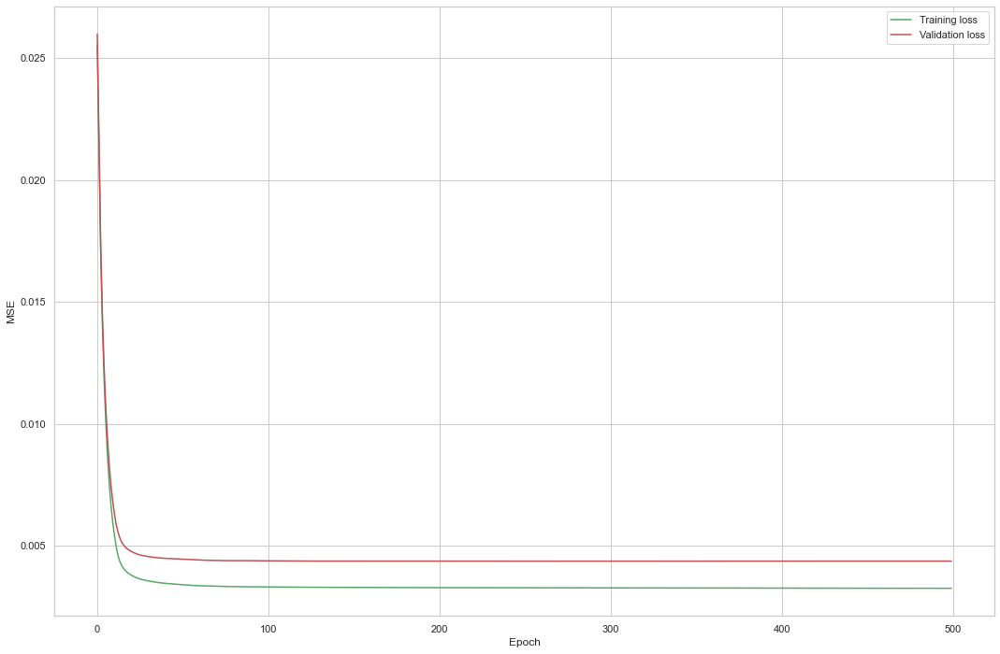

In [40]:
fig = plt.figure(1)
plt.plot(training_losses,'g',label='Training loss')
plt.plot(validation_losses,'r',label='Validation loss')
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('MSE')
fig.show()

In [52]:
# Testing: feed one testing batch at a time
num_test_batches = int(len(test_set_norm)/batch_size)

# Set the model to evaluation mode
model = model.cpu()
model.eval()

preds = []
disp_preds = []
num_val_batch = num_val_seq/seq_len

test_batch_losses = []
t0 = time.time()
for features,labels in val_data:
    # Set the model to evaluation mode
    model.eval()
    model.hidden_1 = (torch.zeros(params_dictionary['layers'],batch_size,model.hidden_size_1),
                        torch.zeros(params_dictionary['layers'],batch_size,model.hidden_size_1))
    
    # Inform PyTorch that I am no longer interested in the gradients
    with torch.no_grad():
        pred = model(features.cpu())
    
    preds.append(pred)
    #disp_preds.append(torch.squeeze(pred[0],dim=0).cpu())
    #test_batch_losses.append(criterion(pred,labels))

t1 = time.time()
print(f'time for test set: {t1-t0}')



time for test set: 0.5897495746612549


In [42]:
predictions = scaler2.inverse_transform(np.array([pred.numpy() for pred in disp_preds]).reshape(-1,2*dof))
true_values = np.array(test_set[:,dof:])

In [43]:
rnn_mse = 0
kf_mse = 0
for i in range(2*dof):
    rnn_mse = rnn_mse + np.var(true_values[:seq_len,i]-predictions[:seq_len,i])
    kf_mse = kf_mse + np.var(true_values[:seq_len,i]-kf_set[:seq_len,i])

print(f"RNN MSE: {rnn_mse}, RNN RMSE:{np.sqrt(rnn_mse)}")
print(f"Kalman filter MSE: {kf_mse}, Kalman filter: RMSE: {np.sqrt(kf_mse)}")
print(f"Percentage: {100*(rnn_mse/kf_mse)}")

RNN MSE: 65.3037596102127, RNN RMSE:8.081074161905253
Kalman filter MSE: 53.910263716997996, Kalman filter: RMSE: 7.342360908930996
Percentage: 121.13418690182054


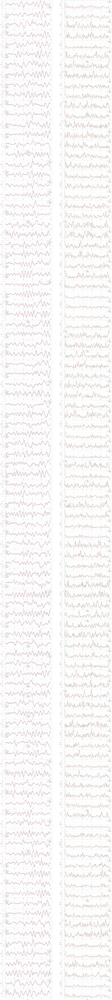

In [44]:
fig = plt.figure(figsize=(32,6*dof))

for i in range(0,2*dof):
    plt.subplot(2*dof, 2, 2*i+1)
    plt.plot(predictions[:seq_len,i],'g',label='RNN')
    plt.plot(true_values[:seq_len,i],'tab:purple',label='True Value')
    plt.plot(kf_results[:seq_len,i],'r',label='Kalman')
    plt.legend(loc="upper right")
    plt.xlabel('Time')
    plt.ylabel(f"x{i}")

    plt.subplot(2*dof, 2, 2*i+2)
    plt.plot(abs(true_values[:seq_len,i] - predictions[:seq_len,i]),'g',label='RNN')
    plt.plot(abs(true_values[:seq_len,i] - kf_results[:seq_len,i].numpy()),'r',label='Kalman')
    plt.legend(loc="upper right")
    plt.xlabel('Time')
    plt.ylabel(f"x{i} error");

In [45]:
#error_array = np.empty(future)
#kalman_error_array = np.empty(future)
#for i in range(future):
    #error_array[i] = mean_squared_error(true_values[i,:], predictions[1+i,:])
    #kalman_error_array[i] = mean_squared_error(true_values[i,:], kf_results[:batch_size,:].numpy())

#fig3 = plt.figure(3)
#plt.plot(error_array,'g',label='RNN')
#plt.plot(kalman_error_array,'r',label='Kalman')
#plt.legend()
#plt.xlabel('Time')
#plt.ylabel('MSE')
#fig3.show()

In [46]:
#torch.save(model.state_dict(), 'Models/LSTM-50DoF-SMD-03022023.pt')